# ID/X Partners Project at Rakamin Academy
By : Savitri Dyah Ayu Pitaloka 

### Task Background
As the final assignment of your contract period as an intern Data Scientist at ID/X Partners, this time you will be involved in a project of a lending company. You will collaborate with various other departments in this project to provide technology solutions for the company. You are asked to build a model that can predict credit risk using a dataset provided by the company consisting of accepted and rejected loan data. In addition, you also need to prepare visual media to present the solution to the client. Make sure the visual media you create is clear, easy to read, and communicative. This end-to-end solution can be done in the Programming Language of your choice while still referring to the Data Science framework/methodology. 
- The data used is loan data 2007-2014 from kaggle with the following link :
https://www.kaggle.com/datasets/devanshi23/loan-data-2007-2014

### Import Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
import seaborn as sns
from math import sqrt
import os
import io
import warnings
warnings.filterwarnings("ignore")

from collections import Counter
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.pipeline import make_pipeline

from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score,f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

### Data Understanding

In [2]:
df = pd.read_csv('loan_data_2007_2014.csv')
pd.set_option('display.max_columns', None)
df.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-96,1.0,35.0,NaN,10.0,0.0,5598,21.0,37.0,f,0.0,0.0,12226.302210,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-15,357.48,NaN,Jan-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-96,0.0,38.0,NaN,15.0,0.0,27783,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-16,67.79,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 75 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   466285 non-null  int64  
 1   id                           466285 non-null  int64  
 2   member_id                    466285 non-null  int64  
 3   loan_amnt                    466285 non-null  int64  
 4   funded_amnt                  466285 non-null  int64  
 5   funded_amnt_inv              466285 non-null  float64
 6   term                         466285 non-null  object 
 7   int_rate                     466285 non-null  float64
 8   installment                  466285 non-null  float64
 9   grade                        466285 non-null  object 
 10  sub_grade                    466285 non-null  object 
 11  emp_title                    438697 non-null  object 
 12  emp_length                   445277 non-null  object 
 13 

In [4]:
df.shape

(466285, 75)

### Data Preprocessing

In [5]:
missing_values = df.isnull().sum() # missing values

percent_missing = df.isnull().sum()/df.shape[0]*100 # missing value %

value = {
    'missing_values ':missing_values,
    'percent_missing %':percent_missing.round(2), 
    'data type' : df.dtypes
}
frame = pd.DataFrame(value)
pd.set_option('display.max_rows', None)
frame

,missing_values,percent_missing %,data type
Unnamed: 0,0,0.00,int64
id,0,0.00,int64
member_id,0,0.00,int64
loan_amnt,0,0.00,int64
funded_amnt,0,0.00,int64
funded_amnt_inv,0,0.00,float64
term,0,0.00,object
int_rate,0,0.00,float64
installment,0,0.00,float64
grade,0,0.00,object


In [6]:
# Filtering data with less than 2 unique values
df.nunique()[df.nunique() < 2].sort_values()

mths_since_rcnt_il           0
inq_fi                       0
all_util                     0
max_bal_bc                   0
open_rv_24m                  0
open_rv_12m                  0
il_util                      0
total_bal_il                 0
total_cu_tl                  0
inq_last_12m                 0
open_il_12m                  0
open_il_6m                   0
open_acc_6m                  0
verification_status_joint    0
dti_joint                    0
annual_inc_joint             0
open_il_24m                  0
application_type             1
policy_code                  1
dtype: int64

In [7]:
# Drop the irrelevant columns and data that have 1 unique value
df.drop(['Unnamed: 0', 'desc', 'mths_since_last_delinq', 'mths_since_last_record', 'mths_since_last_major_derog', 
                'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'open_acc_6m', 'open_il_6m', 
                'open_il_12m', 'open_il_24m','mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 
                'open_rv_24m', 'max_bal_bc', 'all_util', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'policy_code', 
                'application_type','id', 'member_id', 'sub_grade', 'emp_title', 'url', 'title', 
                'zip_code'], axis=1, inplace = True)

In [8]:
categorical = [i for i in df.columns if df[i].dtypes == 'O']

numerical = [i for i in df.columns if i not in categorical]
print('categorical:', categorical, '\n', 'numerical: ', numerical)

categorical: ['term', 'grade', 'emp_length', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'purpose', 'addr_state', 'earliest_cr_line', 'initial_list_status', 'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d'] 
 numerical:  ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_amnt', 'collections_12_mths_ex_med', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim']


##### Check Outliers

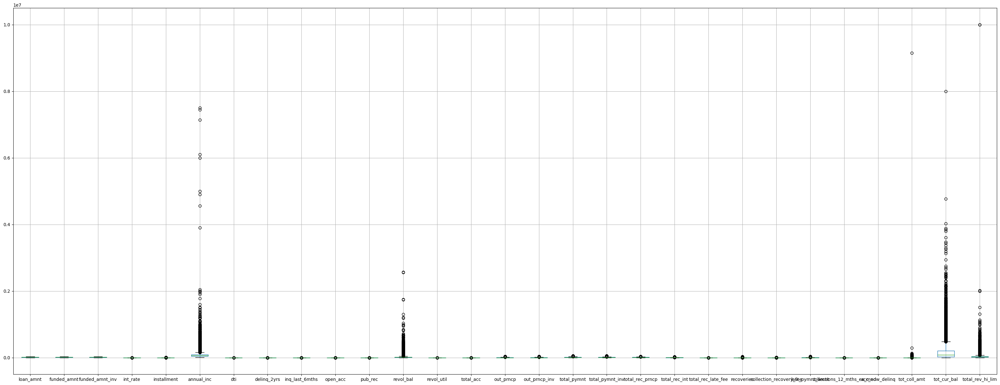

In [9]:
df[numerical].boxplot(figsize=(40,15))
plt.show()

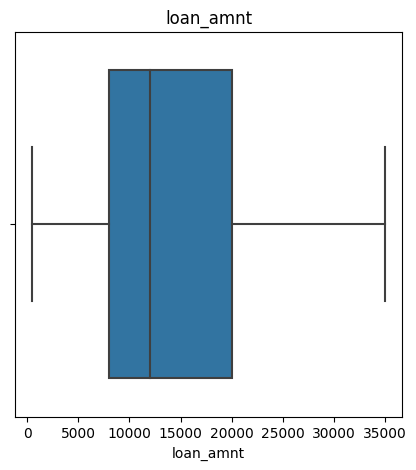

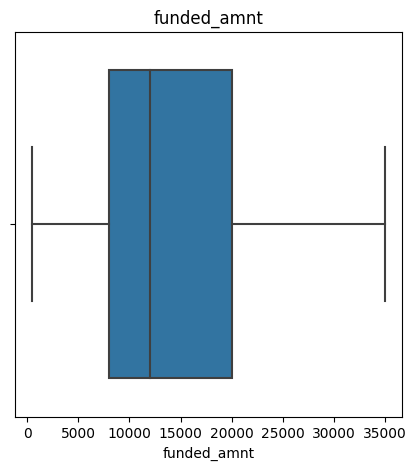

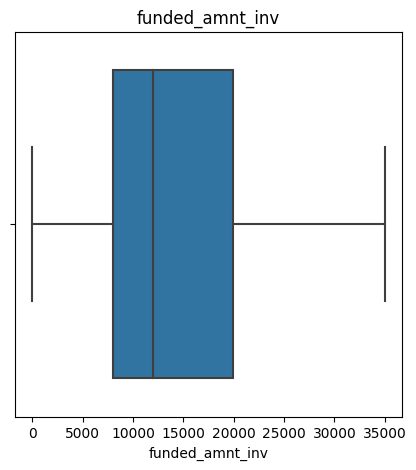

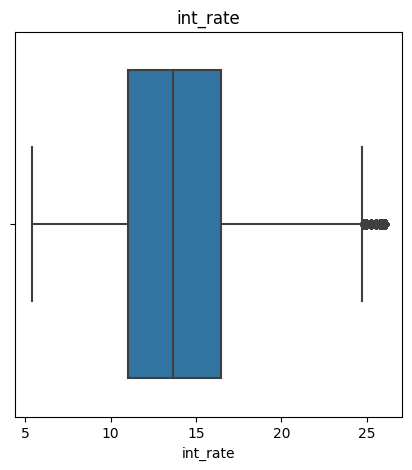

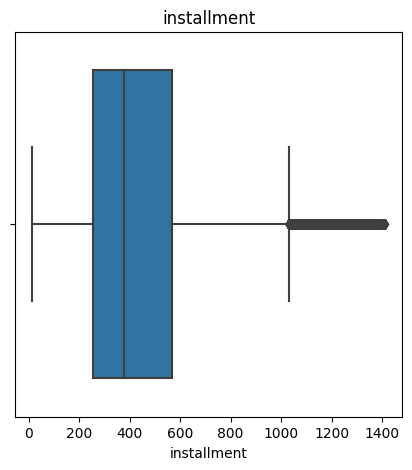

...

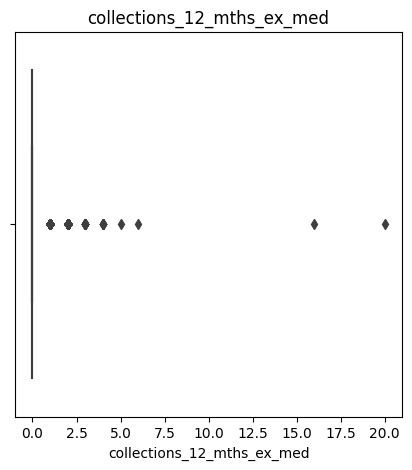

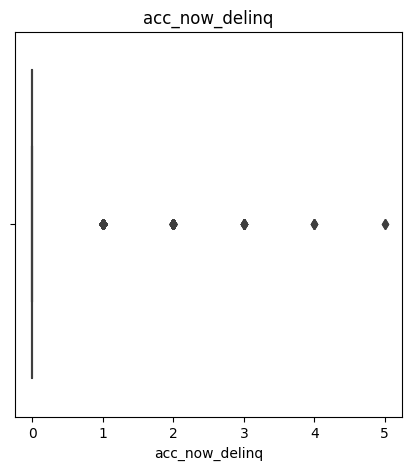

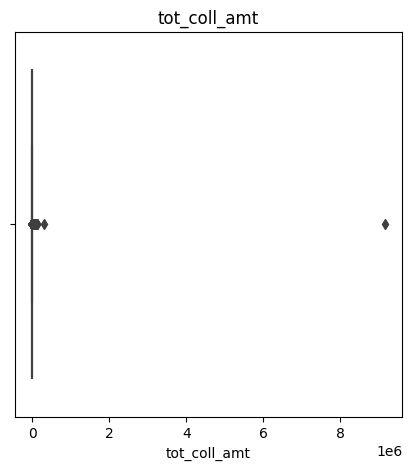

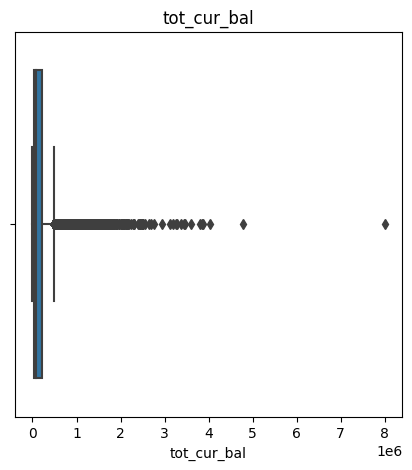

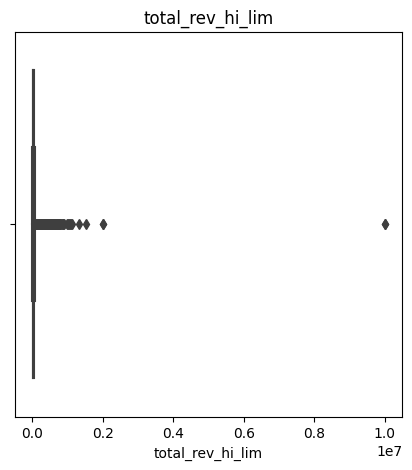

In [10]:
for feature in df[numerical]:
    plt.figure(figsize=(5,5))
    sns.boxplot(df[feature])
    plt.title(feature)

- Column **annual_inc, revol_bal, tot_cur_bal, total_rev_hi_lim** have a lot of outliers. So, I handle outliers with compute the interquartile range.

##### Treat Outliers

In [11]:
features_with_outliers = ['annual_inc','revol_bal','tot_cur_bal','total_rev_hi_lim']
for feature in features_with_outliers:
    q1 = df[feature].quantile(0.25)
    q3 = df[feature].quantile(0.75)
    IQR = q3-q1
    lower_limit = q1 - (IQR*1.5)
    upper_limit = q3 + (IQR*1.5)
    df.loc[df[feature]<lower_limit,feature] = lower_limit
    df.loc[df[feature]>upper_limit,feature] = upper_limit

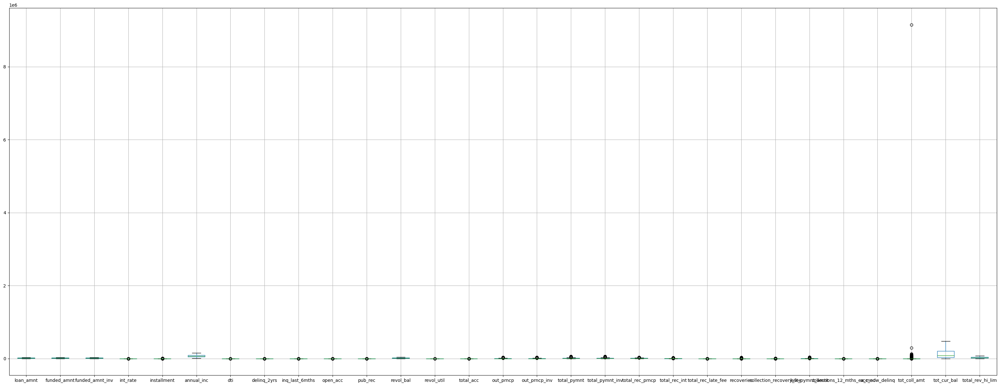

In [12]:
df[numerical].boxplot(figsize=(40,15))
plt.show()

##### Treat Missing Value

In [13]:
categorical_features_with_null = [feature for feature in categorical if df[feature].isnull().sum()]
for each_feature in categorical_features_with_null:
    mode_val = df[each_feature].mode()[0]
    df[each_feature].fillna(mode_val,inplace=True)

In [14]:
numerical_features_with_null = [feature for feature in numerical if df[feature].isnull().sum()]
for feature in numerical_features_with_null:
    mean_value = df[feature].mean()
    df[feature].fillna(mean_value,inplace=True)

In [15]:
missing_values = df.isnull().sum() # missing values

percent_missing = df.isnull().sum()/df.shape[0]*100 # missing value %

value = {
    'missing_values ':missing_values,
    'percent_missing %':percent_missing.round(2), 
    'data type' : df.dtypes
}
frame = pd.DataFrame(value)
pd.set_option('display.max_rows', None)
frame

,missing_values,percent_missing %,data type
loan_amnt,0,0.0,int64
funded_amnt,0,0.0,int64
funded_amnt_inv,0,0.0,float64
term,0,0.0,object
int_rate,0,0.0,float64
installment,0,0.0,float64
grade,0,0.0,object
emp_length,0,0.0,object
home_ownership,0,0.0,object
annual_inc,0,0.0,float64


##### Define Target Variable / Labeling

In [16]:
# Check column 'loan_status' as target variable
df.loan_status.value_counts()

loan_status
Current                                                224226
Fully Paid                                             184739
Charged Off                                             42475
Late (31-120 days)                                       6900
In Grace Period                                          3146
Does not meet the credit policy. Status:Fully Paid       1988
Late (16-30 days)                                        1218
Default                                                   832
Does not meet the credit policy. Status:Charged Off       761
Name: count, dtype: int64

In [17]:
# Divide the number of observations for each unique value of a variable by the total number of observations.
# Thus, I can get the proportion of observations for each unique value of a variable.
df['loan_status'].value_counts() / df['loan_status'].count()

loan_status
Current                                                0.480878
Fully Paid                                             0.396193
Charged Off                                            0.091092
Late (31-120 days)                                     0.014798
In Grace Period                                        0.006747
Does not meet the credit policy. Status:Fully Paid     0.004263
Late (16-30 days)                                      0.002612
Default                                                0.001784
Does not meet the credit policy. Status:Charged Off    0.001632
Name: count, dtype: float64

I want to predict whether a loan is risky or not. Then I will classy the loan as "good" (non risky) and "bad" (risky).
- Good = Current, Fully Paid, In Grace Period, Does not meet the credit policy. Status:Fully Paid
- Bad  = Charged Off, Late (31-120 days), Late (16-30 days), Default, Does not meet the credit policy. Status:Charged Off

In [18]:
# Define values
good_loans = ['Current', 'Fully Paid', 'In Grace Period', 
              'Does not meet the credit policy. Status:Fully Paid']

# Create new column to classify ending
df['loan_risk'] = np.where(df['loan_status'].isin(good_loans), 'Good', 'Bad')

In [19]:
leakage_col = ['issue_d', 'loan_status', 'pymnt_plan', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 
                'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 
                'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d']

df.drop(columns=leakage_col, axis=1, inplace=True)
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,last_credit_pull_d,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,loan_risk
0,5000,5000,4975.0,36 months,10.65,162.87,B,10+ years,RENT,24000.0,Verified,credit_card,AZ,27.65,0.0,Jan-85,1.0,3.0,0.0,13648,83.7,9.0,f,Jan-16,0.0,0.0,191.913517,133525.573053,28086.848367,Good
1,2500,2500,2500.0,60 months,15.27,59.83,C,< 1 year,RENT,30000.0,Source Verified,car,GA,1.00,0.0,Apr-99,5.0,3.0,0.0,1687,9.4,4.0,f,Sep-13,0.0,0.0,191.913517,133525.573053,28086.848367,Bad
2,2400,2400,2400.0,36 months,15.96,84.33,C,10+ years,RENT,12252.0,Not Verified,small_business,IL,8.72,0.0,Nov-01,2.0,2.0,0.0,2956,98.5,10.0,f,Jan-16,0.0,0.0,191.913517,133525.573053,28086.848367,Good
3,10000,10000,10000.0,36 months,13.49,339.31,C,10+ years,RENT,49200.0,Source Verified,other,CA,20.00,0.0,Feb-96,1.0,10.0,0.0,5598,21.0,37.0,f,Jan-15,0.0,0.0,191.913517,133525.573053,28086.848367,Good
4,3000,3000,3000.0,60 months,12.69,67.79,B,1 year,RENT,80000.0,Source Verified,other,OR,17.94,0.0,Jan-96,0.0,15.0,0.0,27783,53.9,38.0,f,Jan-16,0.0,0.0,191.913517,133525.573053,28086.848367,Good


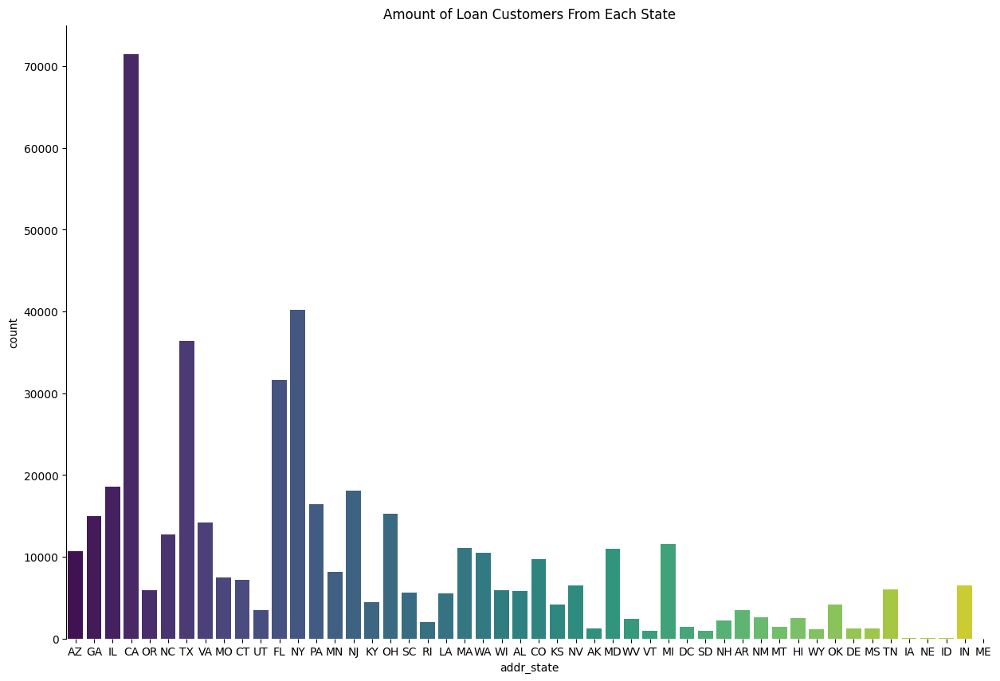

In [20]:
fig = plt.subplots(figsize=(15,10))
sns.countplot('addr_state', data=df, palette='viridis')
plt.title('Amount of Loan Customers From Each State')
sns.despine(bottom=True);

Insight :
- The most state of customer that apply credit is CA (California).
- The states that applied for credit with the least amount were IA (Lowa), NE (Nebraska), ID (Idaho), and ME (Maine).

In [21]:
ex.pie(df,names='home_ownership',title='Propotion Of Home Ownership',hole=0.33)

Insight :
- Most of the home ownership status provided by the borrower during registration is MORTAGE with a percentage of 50.6% of total home ownership.
- And the remaining 49,4% are RENT, OWN, OTHER, NONE, ANY.


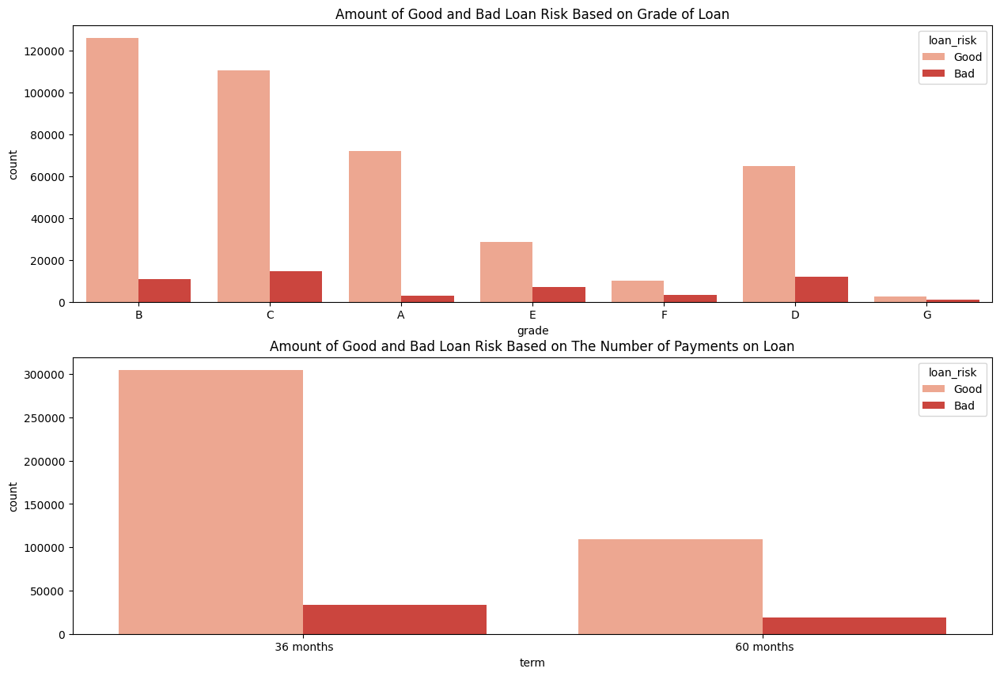

In [22]:
fig,axes = plt.subplots(2, figsize=(15,10))
sns.countplot('grade',hue="loan_risk",data=df,ax=axes[0],palette='Reds')
sns.countplot('term',data=df,hue="loan_risk",ax=axes[1],palette='Reds')
axes[0].set_title('Amount of Good and Bad Loan Risk Based on Grade of Loan')
axes[1].set_title('Amount of Good and Bad Loan Risk Based on The Number of Payments on Loan')
plt.show();

Insight :
- We can see that most of the grade loan that have good risk is B and most of the grade that have bad risk is C.
- And most of the number of payments on loan (term) that have good risk at 36 months and most of the grade that have bad risk at 60 months.


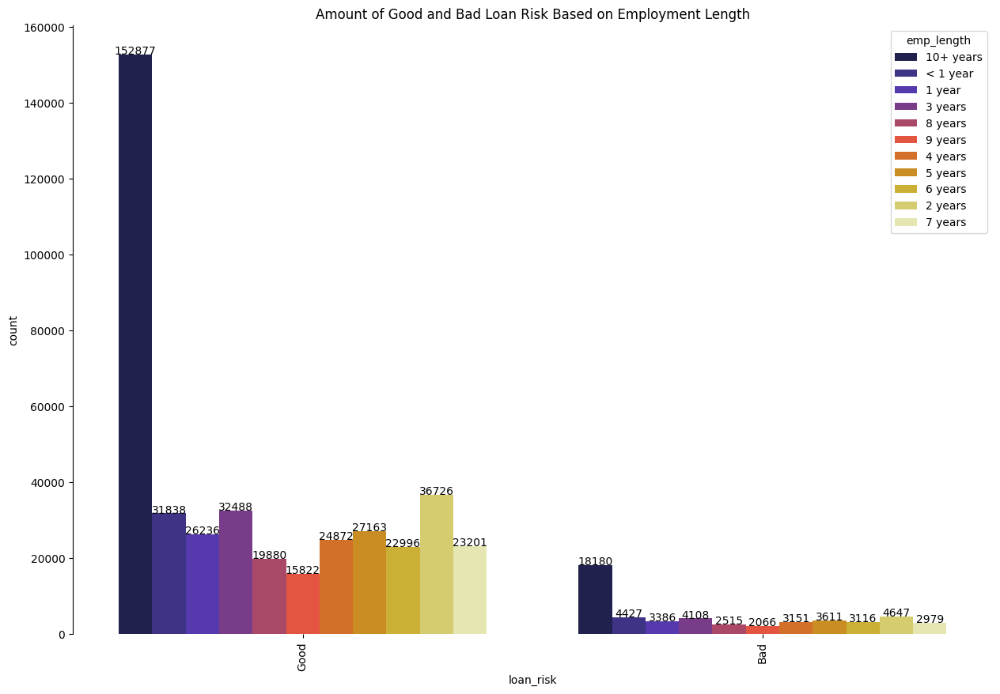

In [23]:
fig, ax1 = plt.subplots(figsize=(15,10))
graph = sns.countplot(ax=ax1,x='loan_risk',hue="emp_length",data=df, palette="CMRmap")
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")
plt.title('Amount of Good and Bad Loan Risk Based on Employment Length')
sns.despine(bottom=True);

Insight :
- The most employment length that have good risk is > 10 years there are 152877 employee.
- The most employment length that have good bad is > 10 years too and there are 18180 employee.


In [24]:
cross_df = pd.crosstab(index = df['purpose'], columns = df['grade'], 
            margins = True, margins_name= "Total", normalize = True).round(4) * 100
cross_df.style.background_gradient(cmap='tab20b')

grade,A,B,C,D,E,F,G,Total
purpose,,,,,,,,
car,0.340000,0.350000,0.250000,0.140000,0.050000,0.020000,0.000000,1.160000
credit_card,5.020000,8.040000,5.590000,2.510000,0.870000,0.240000,0.050000,22.340000
debt_consolidation,7.970000,16.910000,16.720000,10.260000,4.830000,1.710000,0.400000,58.800000
educational,0.020000,0.020000,0.020000,0.010000,0.010000,0.000000,0.000000,0.090000
home_improvement,1.090000,1.590000,1.490000,0.880000,0.450000,0.160000,0.050000,5.690000
house,0.070000,0.110000,0.100000,0.080000,0.060000,0.040000,0.020000,0.490000
major_purchase,0.530000,0.590000,0.490000,0.310000,0.130000,0.050000,0.010000,2.110000
medical,0.110000,0.200000,0.250000,0.230000,0.130000,0.050000,0.010000,0.990000
moving,0.060000,0.110000,0.140000,0.170000,0.110000,0.050000,0.010000,0.640000


Insight :
- Most of purpose from customer that apply loan based on total grade are debt consolidation and credit card.
- Least of purpose from customer that apply loan based on total grade are renewable energy, wedding, vacation, house, moving, educational, and medical.


In [25]:
cross_col = pd.crosstab(index = df['purpose'], columns = df['loan_risk'], 
            normalize='index').round(4) * 100
cross_col.style.background_gradient(cmap='pink')

loan_risk,Bad,Good
purpose,,
car,9.040000,90.960000
credit_card,8.830000,91.170000
debt_consolidation,11.610000,88.390000
educational,20.850000,79.150000
home_improvement,10.070000,89.930000
house,14.190000,85.810000
major_purchase,9.790000,90.210000
medical,13.560000,86.440000
moving,15.530000,84.470000


Insight :
- The most purpose of loan customer that have good risk is small business.
- The least purpose of loan customer that have bad risk is car.

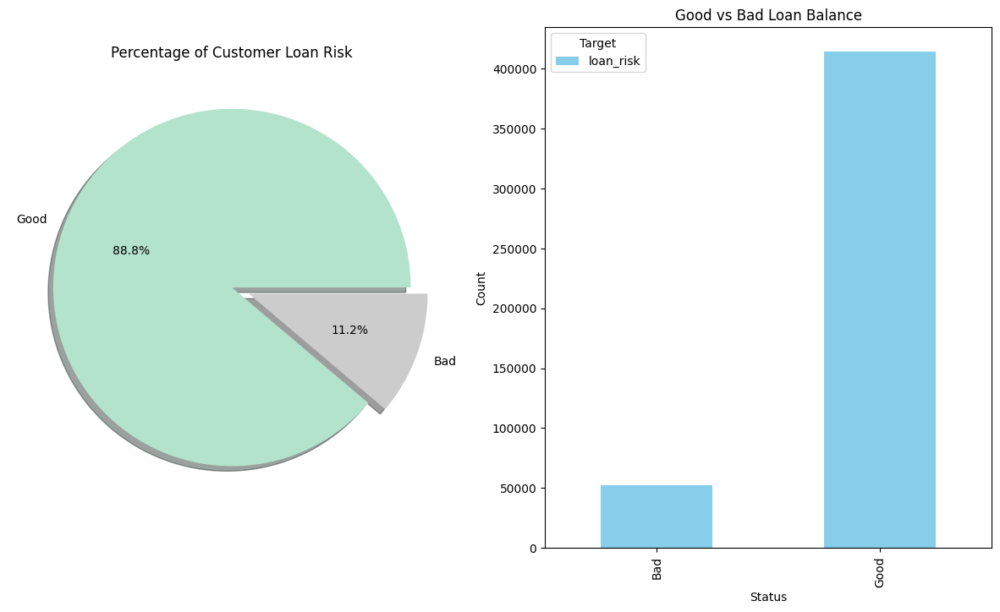

In [26]:
# Check imbalance data
fig, ax = plt.subplots(1,2,figsize=(15,8))

df['loan_risk'].value_counts().plot(
    kind='pie', 
    ax=ax[0], 
    autopct='%.1f%%',
    explode=[0,0.1],
    cmap='Pastel2',
    shadow=True
)
ax[0].set_title('Percentage of Customer Loan Risk')
ax[0].set_ylabel('')

df.groupby('loan_risk').agg({'loan_risk':'count'}).plot(
    kind='bar',
    ax=ax[1], 
    color='skyblue'
)
ax[1].set_title('Good vs Bad Loan Balance')
ax[1].set_ylabel('Count')
ax[1].set_xlabel('Status')
ax[1].legend(title='Target')

plt.show();

- From the results of the pie chart and histogram visualization above, it can be seen that the percentage of 'loan_risk' for "Good" label is **88.8%** and "Bad" label is **11.2%**. This means that there is an *imbalance* in the sample dataset, where "Good" label is much more than the "Bad" label.

In [27]:
# Binary encode for target variable
df['loan_risk'] = df['loan_risk'].replace({'Good':1, 'Bad':0})

In [28]:
categorical = [i for i in df.columns if df[i].dtypes == 'O']

numerical = [i for i in df.columns if i not in categorical]
print('categorical:', categorical, '\n', 'numerical: ', numerical)

categorical: ['term', 'grade', 'emp_length', 'home_ownership', 'verification_status', 'purpose', 'addr_state', 'earliest_cr_line', 'initial_list_status', 'last_credit_pull_d'] 
 numerical:  ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'collections_12_mths_ex_med', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim', 'loan_risk']


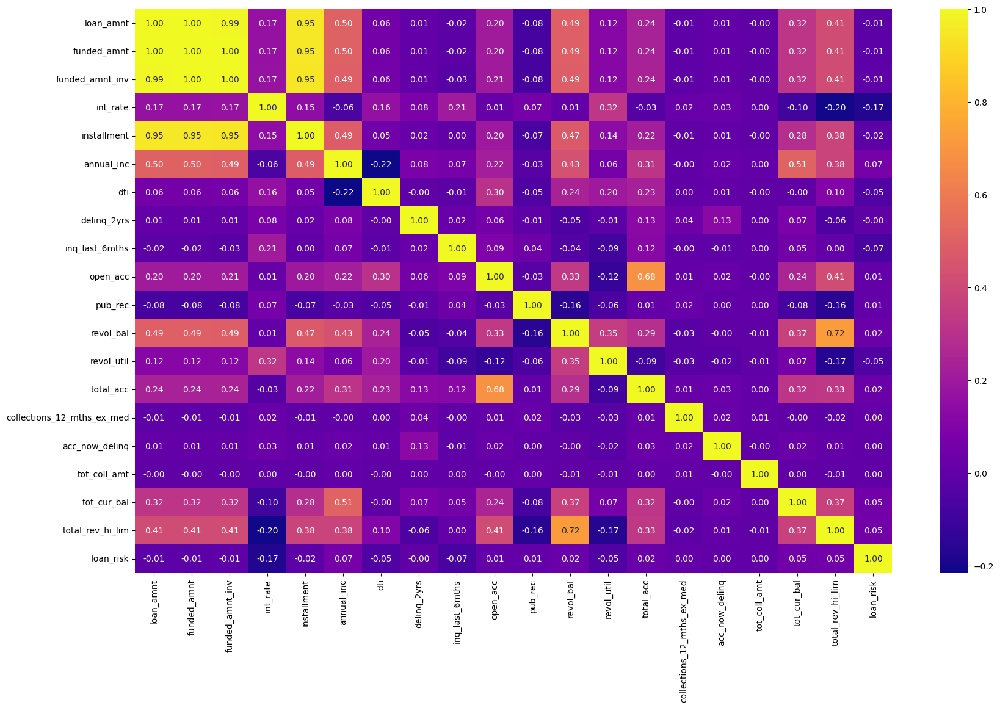

In [29]:
# Check correlation in numerical column
plt.figure(figsize=(20, 12))
sns.heatmap(df[['loan_amnt','funded_amnt','funded_amnt_inv','int_rate','installment','annual_inc',
               'dti','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util',
               'total_acc','collections_12_mths_ex_med','acc_now_delinq','tot_coll_amt','tot_cur_bal',
               'total_rev_hi_lim','loan_risk']].corr(), annot=True, cmap='plasma', fmt=".2f")
plt.show();

In [30]:
df.describe()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,loan_risk
count,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.00000,466285.000000,466285.000000,4.662850e+05,466285.000000,466285.000000,466285.000000
mean,14317.277577,14291.801044,14222.329888,13.829236,432.061201,70209.935369,17.218758,0.284678,0.804745,11.187069,0.160564,14701.053154,56.176947,25.06443,0.009085,0.004002,1.919135e+02,133525.573053,28086.848367,0.888081
std,8286.509164,8274.371300,8297.637788,4.357587,243.485550,33757.841401,7.851121,0.797340,1.091564,4.987371,0.510847,10853.160549,23.723974,11.59978,0.108631,0.068635,1.348272e+04,119424.994759,17618.856158,0.315267
min,500.000000,500.000000,0.000000,5.420000,15.670000,1896.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,8000.000000,8000.000000,8000.000000,10.990000,256.690000,45000.000000,11.360000,0.000000,0.000000,8.000000,0.000000,6413.000000,39.200000,17.00000,0.000000,0.000000,0.000000e+00,33611.000000,15000.000000,1.000000
50%,12000.000000,12000.000000,12000.000000,13.660000,379.890000,63000.000000,16.870000,0.000000,0.000000,10.000000,0.000000,11764.000000,57.500000,23.00000,0.000000,0.000000,0.000000e+00,127160.000000,27100.000000,1.000000
75%,20000.000000,20000.000000,19950.000000,16.490000,566.580000,88953.000000,22.780000,0.000000,1.000000,14.000000,0.000000,20333.000000,74.700000,32.00000,0.000000,0.000000,6.200000e+01,184930.000000,34300.000000,1.000000
max,35000.000000,35000.000000,35000.000000,26.060000,1409.990000,154900.000000,39.990000,29.000000,33.000000,84.000000,63.000000,41213.000000,892.300000,156.00000,20.000000,5.000000,9.152545e+06,479455.500000,74500.000000,1.000000


- From matrix correlation result, column **loan_amnt**, **funded_amnt**, and **funded_amnt_inv** have the same value, it can only be represented by one column and the column chosen is column **loan_amnt**. Column **installment** also dropped because it has a feature correlation value close to 1.

In [31]:
df.drop(columns = ['funded_amnt', 'funded_amnt_inv', 'installment'], inplace = True)

The following variables are not possessing appropriate data types and should be modified. Also the NaN values should be replaced with zeroes wherever applicable. I will define functions to transform their data types.

- emp_length
- term
- last_credit_pull_d
- earliest_cr_line

In [32]:
# Converting emp_length to numeric and assign NaN to zero
emp_map = {
    '< 1 year' : '0',
    '1 year' : '1',
    '2 years' : '2',
    '3 years' : '3',
    '4 years' : '4',
    '5 years' : '5',
    '6 years' : '6',
    '7 years' : '7',
    '8 years' : '8',
    '9 years' : '9',
    '10+ years' : '10'
}
df['emp_length'] = df['emp_length'].map(emp_map).fillna('0').astype(int)
df['emp_length'].unique()

array([10,  0,  1,  3,  8,  9,  4,  5,  6,  2,  7])

In [33]:
# Converting term to numeric

def term_numeric(df, column):
    df[column] = pd.to_numeric(df[column].str.replace(' months', ''))
    
term_numeric(df, 'term')

In [34]:
# Preprocessing date cols 
def date_columns(df, column):
    # Store current month
    today_date = pd.to_datetime('2020-08-01')
    # Convert to datetime format
    df[column] = pd.to_datetime(df[column], format = "%b-%y")
    # Calculate the difference in months and add to a new column
    df['mths_since_' + column] = round(pd.to_numeric((today_date - df[column]) / np.timedelta64(1, 'M')))
    # Make any resulting -ve values to be equal to the max date
    df['mths_since_' + column] = df['mths_since_' + column].apply(lambda x: df['mths_since_' + column].max() if x < 0 else x)
    # Drop the original date column
    df.drop(columns = [column], inplace = True)
date_columns(df, 'last_credit_pull_d')
date_columns(df, 'earliest_cr_line')

In [35]:
# Seperating categorical features from numerical
categorical_features = df.select_dtypes(exclude='number')
numerical_features = df.select_dtypes(exclude='object')

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 27 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   loan_amnt                      466285 non-null  int64  
 1   term                           466285 non-null  int64  
 2   int_rate                       466285 non-null  float64
 3   grade                          466285 non-null  object 
 4   emp_length                     466285 non-null  int32  
 5   home_ownership                 466285 non-null  object 
 6   annual_inc                     466285 non-null  float64
 7   verification_status            466285 non-null  object 
 8   purpose                        466285 non-null  object 
 9   addr_state                     466285 non-null  object 
 10  dti                            466285 non-null  float64
 11  delinq_2yrs                    466285 non-null  float64
 12  inq_last_6mths                

In [37]:
df.shape

(466285, 27)

In [38]:
# Checking for any missing values
df.isna().sum()

loan_amnt                        0
term                             0
int_rate                         0
grade                            0
emp_length                       0
home_ownership                   0
annual_inc                       0
verification_status              0
purpose                          0
addr_state                       0
dti                              0
delinq_2yrs                      0
inq_last_6mths                   0
open_acc                         0
pub_rec                          0
revol_bal                        0
revol_util                       0
total_acc                        0
initial_list_status              0
collections_12_mths_ex_med       0
acc_now_delinq                   0
tot_coll_amt                     0
tot_cur_bal                      0
total_rev_hi_lim                 0
loan_risk                        0
mths_since_last_credit_pull_d    0
mths_since_earliest_cr_line      0
dtype: int64

- There are no missing values anymore and the data has been converted properly.

In [39]:
df.describe()

,loan_amnt,term,int_rate,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,loan_risk,mths_since_last_credit_pull_d,mths_since_earliest_cr_line
count,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.00000,466285.000000,466285.000000,4.662850e+05,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000
mean,14317.277577,42.605334,13.829236,6.173846,70209.935369,17.218758,0.284678,0.804745,11.187069,0.160564,14701.053154,56.176947,25.06443,0.009085,0.004002,1.919135e+02,133525.573053,28086.848367,0.888081,58.006153,269.419169
std,8286.509164,10.719040,4.357587,3.640525,33757.841401,7.851121,0.797340,1.091564,4.987371,0.510847,10853.160549,23.723974,11.59978,0.108631,0.068635,1.348272e+04,119424.994759,17618.856158,0.315267,9.482343,84.889214
min,500.000000,36.000000,5.420000,0.000000,1896.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,54.000000,103.000000
25%,8000.000000,36.000000,10.990000,3.000000,45000.000000,11.360000,0.000000,0.000000,8.000000,0.000000,6413.000000,39.200000,17.00000,0.000000,0.000000,0.000000e+00,33611.000000,15000.000000,1.000000,54.000000,212.000000
50%,12000.000000,36.000000,13.660000,7.000000,63000.000000,16.870000,0.000000,0.000000,10.000000,0.000000,11764.000000,57.500000,23.00000,0.000000,0.000000,0.000000e+00,127160.000000,27100.000000,1.000000,54.000000,253.000000
75%,20000.000000,60.000000,16.490000,10.000000,88953.000000,22.780000,0.000000,1.000000,14.000000,0.000000,20333.000000,74.700000,32.00000,0.000000,0.000000,6.200000e+01,184930.000000,34300.000000,1.000000,56.000000,311.000000
max,35000.000000,60.000000,26.060000,10.000000,154900.000000,39.990000,29.000000,33.000000,84.000000,63.000000,41213.000000,892.300000,156.00000,20.000000,5.000000,9.152545e+06,479455.500000,74500.000000,1.000000,156.000000,608.000000


In [40]:
df.describe(include='O')

,grade,home_ownership,verification_status,purpose,addr_state,initial_list_status
count,466285,466285,466285,466285,466285,466285
unique,7,6,3,14,50,2
top,B,MORTGAGE,Verified,debt_consolidation,CA,f
freq,136929,235875,168055,274195,71450,303005


In [41]:
# Encode categorical columns with Label Encoder
le = LabelEncoder()
cat_col = df.select_dtypes(object).columns.tolist()
df[cat_col] =df[cat_col].astype('str').apply(le.fit_transform)

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 27 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   loan_amnt                      466285 non-null  int64  
 1   term                           466285 non-null  int64  
 2   int_rate                       466285 non-null  float64
 3   grade                          466285 non-null  int32  
 4   emp_length                     466285 non-null  int32  
 5   home_ownership                 466285 non-null  int32  
 6   annual_inc                     466285 non-null  float64
 7   verification_status            466285 non-null  int32  
 8   purpose                        466285 non-null  int32  
 9   addr_state                     466285 non-null  int32  
 10  dti                            466285 non-null  float64
 11  delinq_2yrs                    466285 non-null  float64
 12  inq_last_6mths                

In [42]:
X = df.drop(['loan_risk'], axis=1)
y = df['loan_risk'].astype('int64')

print(X.shape)
print(y.shape)

(466285, 26)
(466285,)


##### Feature Selection

In [43]:
data = pd.read_csv('loan_data_2007_2014.csv')
X = df.drop(['loan_risk'], axis=1)
y = df['loan_risk'] 

# Apply SelectKBest class to extract top 15 best features
bestfeatures = SelectKBest(chi2, k=15)
X_new = bestfeatures.fit_transform(X, y)
names = X.columns.values[bestfeatures.get_support()]
scores = bestfeatures.scores_[bestfeatures.get_support()]
names_scores = list(zip(names, scores))
df_column = pd.DataFrame(data = names_scores, columns=['Feat_names', 'Chi2_Scores'])
df_column

,Feat_names,Chi2_Scores
0,loan_amnt,3.885318e+05
1,term,5.254776e+03
2,int_rate,1.952854e+04
3,grade,1.262447e+04
4,annual_inc,3.484247e+07
5,purpose,1.925577e+03
6,dti,4.022871e+03
7,inq_last_6mths,3.689828e+03
8,revol_bal,1.824271e+06
9,revol_util,1.214732e+04


In [44]:
X_fit = df[['loan_amnt', 'term', 'int_rate', 'grade', 'annual_inc', 'purpose', 'dti', 'inq_last_6mths', 
            'revol_bal', 'revol_util', 'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim', 
            'mths_since_earliest_cr_line','mths_since_last_credit_pull_d']]
X_fit.head()

,loan_amnt,term,int_rate,grade,annual_inc,purpose,dti,inq_last_6mths,revol_bal,revol_util,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,mths_since_earliest_cr_line,mths_since_last_credit_pull_d
0,5000,36,10.65,1,24000.0,1,27.65,1.0,13648,83.7,191.913517,133525.573053,28086.848367,419.0,54.0
1,2500,60,15.27,2,30000.0,0,1.00,5.0,1687,9.4,191.913517,133525.573053,28086.848367,251.0,81.0
2,2400,36,15.96,2,12252.0,11,8.72,2.0,2956,98.5,191.913517,133525.573053,28086.848367,221.0,54.0
3,10000,36,13.49,2,49200.0,9,20.00,1.0,5598,21.0,191.913517,133525.573053,28086.848367,289.0,66.0
4,3000,60,12.69,1,80000.0,9,17.94,0.0,27783,53.9,191.913517,133525.573053,28086.848367,290.0,54.0


In [45]:
# splitting data
X_train, X_test, y_train, y_test = train_test_split(X_fit, y, test_size = 0.20, random_state = 46)

In [46]:
# Scale dan Transform X
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

##### Treat Imbalance Data

In [47]:
print("Before Oversampling: ",Counter(y_train))

Before Oversampling:  Counter({1: 331395, 0: 41633})


In [48]:
# Randomly over sample the minority class
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler()
X_oversampled,y_oversampled= ros.fit_resample(X_train, y_train)

In [49]:
print("After Oversampling: ",Counter(y_oversampled))

After Oversampling:  Counter({1: 331395, 0: 331395})


- From the results, it can be seen that labels 0 and 1 are balanced, so the imbalance has been resolved and the data is ready for modeling in classification.

### Modeling

In [50]:
model1 = LogisticRegression()
model2 = XGBClassifier(n_estimators=488, learning_rate=0.5078131126646168, max_depth=3, reg_alpha=0.09285092177454037)

In [51]:
model1.fit(X_oversampled, y_oversampled)

LogisticRegression()

In [52]:
model2.fit(X_oversampled, y_oversampled)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.5078131126646168, max_bin=256,
              max_cat_to_onehot=4, max_delta_step=0, max_depth=3, max_leaves=0,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=488, n_jobs=0, num_parallel_tree=1, predictor='auto',
              random_state=0, reg_alpha=0.09285092177454037, reg_lambda=1, ...)

### Model Evaluation

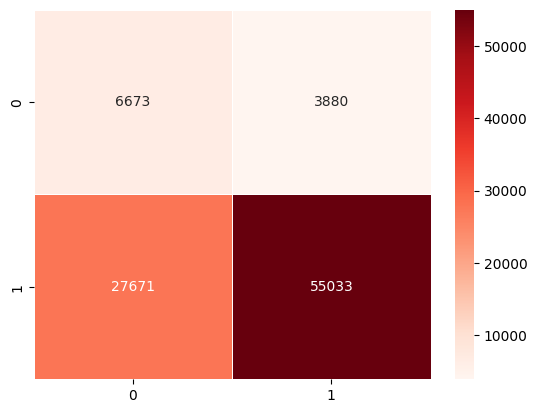

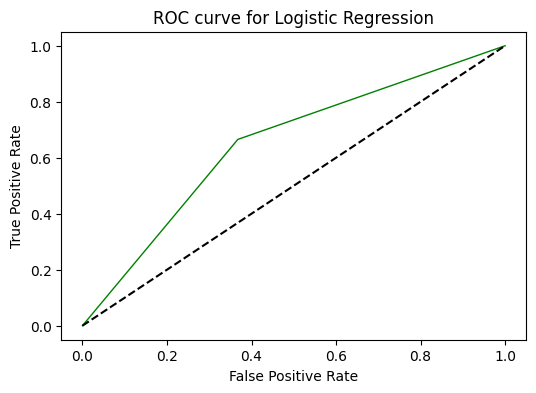

Cross-validation scores:[0.64481963 0.64724121 0.64627559 0.64442735 0.64361261]
Average cross-validation score: 0.6452752757283605
              precision    recall  f1-score   support

           0       0.19      0.63      0.30     10553
           1       0.93      0.67      0.78     82704

    accuracy                           0.66     93257
   macro avg       0.56      0.65      0.54     93257
weighted avg       0.85      0.66      0.72     93257



In [53]:
y_pred = model1.predict(X_test)

lr = confusion_matrix(y_test, y_pred)
sns.heatmap(lr, annot=True, fmt="d", linewidths=.5, cmap = 'Reds')
plt.show()

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(6,4))
plt.plot(fpr,tpr,'-g',linewidth=1)
plt.plot([0,1], [0,1], 'k--' )
plt.title('ROC curve for Logistic Regression')
plt.xlabel("False Positive Rate")
plt.ylabel('True Positive Rate')
plt.show();

scores = cross_val_score(model1, X_oversampled, y_oversampled, cv = 5, scoring='accuracy')
print('Cross-validation scores:{}'.format(scores))
print('Average cross-validation score: {}'.format(scores.mean()))
print(classification_report(y_test, y_pred))

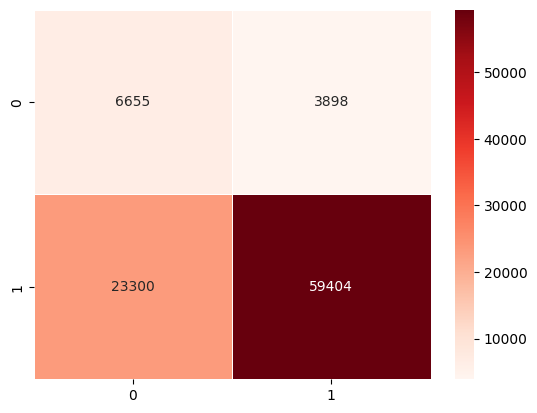

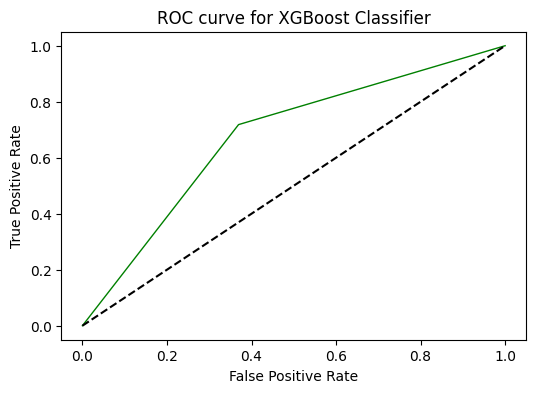

Cross-validation scores:[0.71049654 0.71266163 0.71186952 0.70965917 0.70854268]
Average cross-validation score: 0.7106459059430589
              precision    recall  f1-score   support

           0       0.22      0.63      0.33     10553
           1       0.94      0.72      0.81     82704

    accuracy                           0.71     93257
   macro avg       0.58      0.67      0.57     93257
weighted avg       0.86      0.71      0.76     93257



In [54]:
y_pred = model2.predict(X_test)

xgb = confusion_matrix(y_test, y_pred)
sns.heatmap(xgb, annot=True, fmt="d", linewidths=.5, cmap = 'Reds')
plt.show()

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(6,4))
plt.plot(fpr,tpr,'-g',linewidth=1)
plt.plot([0,1], [0,1], 'k--' )
plt.title('ROC curve for XGBoost Classifier')
plt.xlabel("False Positive Rate")
plt.ylabel('True Positive Rate')
plt.show();

scores = cross_val_score(model2, X_oversampled, y_oversampled, cv = 5, scoring='accuracy')
print('Cross-validation scores:{}'.format(scores))
print('Average cross-validation score: {}'.format(scores.mean()))
print(classification_report(y_test, y_pred))

Conclusion :
- Based on the comparison of the recall and accuracy values of the two models, the XGBoost Classifier Model was chosen as the best model for predicting credit risk in leading company, because it has a higher recall and accuracy value than the Logistic Regression Model.

### Overall Analysis
- There are 75 attributes that are assumed to affect credit risk. After analysis, the 15 most influential attributes in the model (feature importances) were taken.
- In defining the target / labelling variable, it is divided into two categories, namely "Good" and "Bad". Those in “Good” category are customers who are Current, Fully Paid, In Grace Period, Does not meet the credit policy (Status: Fully Paid). While those in "Bad" category are customers who are Charged Off, Late (31-120 days), Late (16-30 days), Default, Does not meet the credit policy (Status: Charged Off).
- In this analysis, there are also several data visualizations using boxplots, pie charts, groupby and query examples of existing data, and correlation matrix (heatmap).
- Because the target variable (loan_risk) has a large enough difference in the amount of data to experience data imbalance, an experiment was conducted to handle imbalanced data using the Random Oversample method to resample for the minority class in data train.
- After doing the training model with oversampling data, the accuracy for each class "Bad and "Good" is obtained with a fairly stable value (the average accuracy of each class is > 58%). So it can be said that the use of oversampling can help the model during training so that it can detect bad loan and good loan classes quite well.
- In this project, to predict credit risk in lending companies using Logistic Regression Model and XGBoost Classifier Model.
- In Logistic Regression Model, the evaluation value based on label 0 and label 1. The label 0 has **precision = 0.19, recall = 0.63, and f1-score = 0.30**. While the label 1 has **precision = 0.93, recall = 0.67, and f1-score = 0.78**. Overall has an accuracy of **0.66**.
- The evaluation value from XGBoost Classifier Model based on label 0 and label 1. The label 0 has **precision = 0.22, recall = 0.63, and f1-score = 0.33**.  While the label 1 has **precision = 0.94, recall = 0.72, and f1-score = 0.81**. Overall has an accuracy of **0.71**.
- Although accuracy value in both models is still not high but this value is already quite high due to the imbalanced dataset. So, model evaluation that used is Recall and Accuracy. The best model chosen to predict credit risk is XGBoost Classifier Model.